# Pruebas lecturas archivos spss  
  

Cargamos las librerias necesarias, paso tipico en python

In [ ]:
# Esto es necesario para que funcione el read_spss de pandas
# !pip install pyreadstat
# Y esto apra que funcione ydata-profiling
# !pip install ipiwidgets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import glob, os
# print(pd.__version__)
# Configuro estilo seaborn
sns.set_theme(style='ticks', context='talk', palette='tab10')

# Suprimo los warnings
import warnings
warnings.simplefilter(action='ignore', category=(FutureWarning, UserWarning))

from ydata_profiling import ProfileReport

La libreria *pandas* puede leer archivos *.sav*  que son del software spss.  
Estos archivos son comparables a un **dataframe** de R o pandas  
En este caso leemos la "Base_Septiembre.sav"

In [2]:
df = pd.read_spss("Base PBA 19-10-23.sav")
df.sample(4)

,Metodo,plaza,Estrato,Sexo,Edad,estudios,P4,P5,P18,pondedad,...,pondedad2,pondedadestudiosestratoestudios2edad2,pondsexo,pondedadestudiosestratoestudios2edad2sexo,pondvotant,pondedadestudiosestratoestudios2edad2sexovotant,pondestrato2,pondedadestudiosestratoestudios2edad2sexovotantestrato2,pondedad3,pondedadestudiosestratoestudios2edad2sexovotantestrato2edad3
368,IVR,NaN,3,1 - Hombre,Mayor de 50 años,"3 - Nivel Universitario o Terciario, ya sea co...",Patricia Bullrich de Juntos por el cambio,Néstor Grindetti de Juntos,Bullrich,0.551987,...,1.046593,0.441629,0.95935,0.423677,0.792089,0.335590,0.892252,0.299431,1.071909,0.320962
794,IVR,Lomas de Zamora,Tercera,1 - Hombre,Mayor de 50 años,"3 - Nivel Universitario o Terciario, ya sea co...",Sergio Massa de Unidos por la patria,Axel Kicillof de Unión por la Patria,Sergio Massa,0.551987,...,1.046593,0.311453,0.95935,0.298792,0.859818,0.256907,1.019545,0.261928,1.071909,0.280763
818,IVR,Perón,Tercera,1 - Hombre,16 a 23 años,"3 - Nivel Universitario o Terciario, ya sea co...",Sergio Massa de Unidos por la patria,En blanco o no irá a votar,Sergio Massa,2.458147,...,1.017743,1.348750,0.95935,1.293924,0.859818,1.112539,1.019545,1.134284,0.891793,1.011547
1074,Presencial,Lomas de Zamora,Tercera,1 - Hombre,24 a 29 años,"3 - Nivel Universitario o Terciario, ya sea co...",Sergio Massa de Unidos por la patria,Axel Kicillof de Unión por la Patria,Juan Grabois,1.747154,...,0.985477,0.928246,0.95935,0.890513,1.864316,1.660198,1.019545,1.692646,0.970095,1.642028


Esto parece ser un crudo de encuestas, que es lo que estamos buscando para analizar, tendre que revisar la documentacion de la carpeta donde esta el archivo *.sav*   
Veamos un poco de la estadistica del dataframe  

In [10]:
df.describe()

,weight
count,823.000000
mean,0.998552
std,1.406367
min,0.101983
25%,0.261849
50%,0.499667
75%,1.197173
max,9.205951


Sacare una lista de los nombres de las columnas para ver si la puedo hacer coincidir con la documentacion.  

In [11]:
columnas_de_la_base = df.columns
print(columnas_de_la_base)

Index(['Metodo', 'Ciudad', 'Estrato', 'Sexo', 'Edad', 'estudios', 'p4', 'p5',
       'p8', 'p9', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p17', 'p18',
       'p19', 'p20', 'p21', 'p22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28',
       'P29', 'P30', 'P31', 'P32', 'zona', 'BULLRICH', 'CRISTINA', 'MACRI',
       'LARRETA', 'MASSA', 'MILEI', 'ALBERTO', 'KICILLOF', 'WADO', 'SCIOLI',
       'SANTILLI', 'GRINDETTI', 'TETAZ', 'weight'],
      dtype='object')


Como hay algunos archivos en formato excel y pandas puede leerlos tambien, probemos a ver que tienen.  
En este caso es Resultados_CABA_Sept.xlsx

In [3]:
# Usamos una herramienta integrada para analizar el dataframe
profile = ProfileReport(df, title="Reporte")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [42]:
df_excell = pd.read_excel("Resultados_CABA_Sept.xlsx")
df_excell

,,Unnamed: 1,Unnamed: 2,Sexo,Unnamed: 4,Edad,Unnamed: 6,Unnamed: 7,Educación,Unnamed: 9,...,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46
0,NaN,NaN,Total,1 - Hombre,2 - Mujer,1 - 18 a 29,2 - 30 a 49,3 - Más de 50,"1 - Nivel Primario, ya sea completo o incompleto","2 - Nivel Secundario, ya sea completo o incomp...",...,Javier Milei y Victoria Villarruel de La Liber...,Juan Schiaretti y Florencio Randazzo del Peron...,Myriam Bregman,En blanco/ No votaría,No sabe / No contesta,NaN,NaN,NaN,NaN,NaN
1,Si las elecciones presidenciales fueran mañana...,Sergio Massa de Unidos por la patria,0.247,0.238267,0.254967,0.386364,0.265306,0.219941,0.446429,0.2375,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Patricia Bullrich de Juntos por el cambio,0.4103,0.34296,0.47351,0.113636,0.290816,0.516129,0.196429,0.3375,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,Javier Milei de Avanza Libertad,0.204819,0.296029,0.122517,0.340909,0.290816,0.13783,0.214286,0.30625,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,Juan Schiaretti de Hacemos por nuestro país,0.009,0.01083,0.006623,NaN,0.010204,0.008798,0.017857,0.00625,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,Myriam Bregmandel Frente de Izquierda,0.039,0.028881,0.046358,0.068182,0.076531,0.014663,0.017857,0.025,...,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,En blanco o no irá a votar,0.045,0.043321,0.046358,0.045455,0.045918,0.043988,0.053571,0.03125,...,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,No sabe // Está indeciso,0.045,0.039711,0.049669,0.045455,0.020408,0.058651,0.053571,0.05625,...,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN
8,Si las elecciones a Jefe de Gobierno fueran ...,Jorge Macri de Juntos,0.472,0.447653,0.493421,0.190476,0.377551,0.56305,0.285714,0.403727,...,0.310924,0.6,0.136364,0.076923,0.346154,NaN,NaN,NaN,NaN,NaN
9,NaN,Leandro Santoro de Unión por la Patria,0.208,0.194946,0.220395,0.166667,0.209184,0.211144,0.178571,0.21118,...,0.042017,0.2,NaN,0.038462,0.153846,NaN,NaN,NaN,NaN,NaN


La informacion en esas tablas excel mayormente son datos digeridos y orientados a presentacion visual.  
Volvamos a los que tienen datos crudos spss, ahora uno de CABA  

In [43]:
caba_df = pd.read_spss("Entrega_CABA_09.10.2023-1 (1).sav REDUCC INDECIS.sav")

In [44]:
caba_df

,Metodo,Q20,Q3,Q4a,Q5,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q17_otros,pond
0,CATI,Comuna 07,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Algo Positiva,Muy Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.49861
1,CATI,Comuna 13,Femenino,50-75,"Nivel Secundario, ya sea completo o incompleto",No conoce / No tiene opinión formada,Algo Positiva,Algo Positiva,Algo Positiva,Algo Positiva,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.95075
2,CATI,Comuna 13,Masculino,16-29,"Nivel Secundario, ya sea completo o incompleto",Algo Negativa,Algo Positiva,Muy Positiva,Muy Positiva,Muy Positiva,Muy Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.94502
3,CATI,Comuna 04,Masculino,30-49,"Nivel Primario, ya sea completo o incompleto",Muy Positiva,Muy Negativa,Muy Negativa,Muy Negativa,Algo Positiva,Algo Negativa,Muy Negativa,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.98170
4,Presencial,Comuna 05,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Algo Positiva,Muy Negativa,Muy Negativa,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.51904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,Presencial,Comuna 13,Masculino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Negativa,Algo Positiva,Algo Positiva,Algo Positiva,Muy Negativa,Muy Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,1.64780
796,Presencial,Comuna 09,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Muy Negativa,No conoce / No tiene opinión formada,Algo Positiva,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Positiva,En blanco,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,2.53547
797,Presencial,Comuna 08,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Muy Negativa,Algo Negativa,Muy Negativa,No conoce / No tiene opinión formada,Muy Negativa,Algo Negativa,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Jorge Macri de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,1.02524
798,Presencial,Comuna 08,Femenino,30-49,"Nivel Secundario, ya sea completo o incompleto",Muy Negativa,Algo Positiva,Algo Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,2.73265


Y ahora con uno que esta en la misma carpeta  

In [45]:
caba2_df = pd.read_spss("Entrega_CABA_09.10.2023-1 (1).sav")
caba2_df

,Metodo,Q20,Q3,Q4a,Q5,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q17_otros,pond
0,Presencial,Comuna 07,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,No sabe/No contesta,No sabe / No contesta,10.0,En blanco/ No votaría,,0.93753
1,Presencial,Comuna 08,Femenino,16-29,"Nivel Secundario, ya sea completo o incompleto",No conoce / No tiene opinión formada,Algo Negativa,Muy Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Ramiro Marra de La Libertad Avanza,No sabe / No contesta,Vanina Biasi del Frente de Izquierda,Javier Milei y Victoria Villarruel de La Liber...,,0.89120
2,CATI,Comuna 12,Masculino,30-49,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Positiva,Muy Positiva,Muy Positiva,Algo Negativa,Muy Positiva,Algo Positiva,Jorge Macri de Juntos,No sabe / No contesta,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,0.62507
3,CATI,Comuna 07,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Algo Positiva,Muy Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.49861
4,CATI,Comuna 13,Femenino,50-75,"Nivel Secundario, ya sea completo o incompleto",No conoce / No tiene opinión formada,Algo Positiva,Algo Positiva,Algo Positiva,Algo Positiva,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.95075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,Presencial,Comuna 08,Femenino,30-49,"Nivel Secundario, ya sea completo o incompleto",Muy Negativa,Algo Positiva,Algo Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,2.73265
796,Presencial,Comuna 08,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Negativa,Algo Positiva,Algo Positiva,No conoce / No tiene opinión formada,Algo Negativa,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,0.54530
797,Presencial,Comuna 08,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Algo Negativa,Muy Negativa,Algo Positiva,Algo Negativa,Algo Negativa,Muy Positiva,Muy Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,1.02524
798,Presencial,Comuna 08,Masculino,30-49,"Nivel Universitario o Terciario, ya sea comple...",Algo Negativa,Muy Negativa,Algo Negativa,Algo Negativa,Algo Negativa,No conoce / No tiene opinión formada,Algo Negativa,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,1.42321


Leyendo la documentacion agregue estas nombres a las columnas, (puede que no esten correctas **REVISAR**)

In [46]:
caba2_df.columns = ['metodo', 'comuna', 'genero', 'edad', 'educacion', 'img_larreta', 'img_m_macri', 'img_milei', 'img_cfk', 'img_lousteau', 'img_j_macri', 'img_vidal', 'img_quiroz',
                    '14', 'voto_antes', 'votaria_ahora', '17', '18']
caba2_df

,metodo,comuna,genero,edad,educacion,img_larreta,img_m_macri,img_milei,img_cfk,img_lousteau,img_j_macri,img_vidal,img_quiroz,14,voto_antes,votaria_ahora,17,18
0,Presencial,Comuna 07,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Algo Negativa,No sabe/No contesta,No sabe / No contesta,10.0,En blanco/ No votaría,,0.93753
1,Presencial,Comuna 08,Femenino,16-29,"Nivel Secundario, ya sea completo o incompleto",No conoce / No tiene opinión formada,Algo Negativa,Muy Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Ramiro Marra de La Libertad Avanza,No sabe / No contesta,Vanina Biasi del Frente de Izquierda,Javier Milei y Victoria Villarruel de La Liber...,,0.89120
2,CATI,Comuna 12,Masculino,30-49,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Positiva,Muy Positiva,Muy Positiva,Algo Negativa,Muy Positiva,Algo Positiva,Jorge Macri de Juntos,No sabe / No contesta,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,0.62507
3,CATI,Comuna 07,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Algo Positiva,Muy Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.49861
4,CATI,Comuna 13,Femenino,50-75,"Nivel Secundario, ya sea completo o incompleto",No conoce / No tiene opinión formada,Algo Positiva,Algo Positiva,Algo Positiva,Algo Positiva,Algo Negativa,Algo Positiva,No sabe/No contesta,No sabe / No contesta,No sabe/No contesta,No sabe / No contesta,,0.95075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,Presencial,Comuna 08,Femenino,30-49,"Nivel Secundario, ya sea completo o incompleto",Muy Negativa,Algo Positiva,Algo Negativa,Algo Negativa,No conoce / No tiene opinión formada,No conoce / No tiene opinión formada,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,2.73265
796,Presencial,Comuna 08,Femenino,50-75,"Nivel Universitario o Terciario, ya sea comple...",Muy Negativa,Muy Negativa,Algo Positiva,Algo Positiva,No conoce / No tiene opinión formada,Algo Negativa,Algo Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,0.54530
797,Presencial,Comuna 08,Masculino,30-49,"Nivel Secundario, ya sea completo o incompleto",Algo Negativa,Muy Negativa,Algo Positiva,Algo Negativa,Algo Negativa,Muy Positiva,Muy Positiva,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,,1.02524
798,Presencial,Comuna 08,Masculino,30-49,"Nivel Universitario o Terciario, ya sea comple...",Algo Negativa,Muy Negativa,Algo Negativa,Algo Negativa,Algo Negativa,No conoce / No tiene opinión formada,Algo Negativa,Jorge Macri de Juntos,Patricia Bullrich y Luis Petri de Juntos por e...,Martín Lousteau de Juntos,Horacio Rodríguez Larreta y Gerardo Morales de...,,1.42321


Intentare hacer algunos graficos para hacer una exploracion de datos cruzando info de las columnas

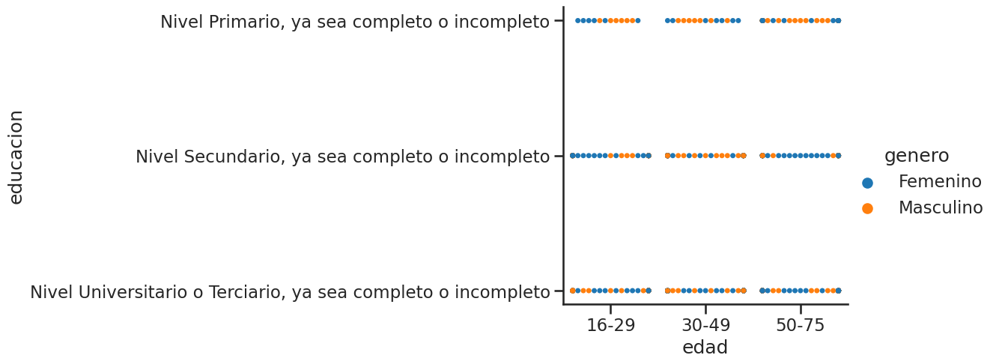

In [31]:
sns.catplot(data=caba2_df, y='educacion', x='edad', kind='swarm', hue='genero' )
plt.show()

Una tabla de contingencia entre las columnas de a quien voto y a quien votaria

In [47]:
pd.crosstab(caba2_df['votaria_ahora'] ,  caba2_df['voto_antes'])

voto_antes,10.0,En blanco,Jorge Adaro del Frente de Izquierda,Jorge Macri de Juntos,Leandro Santoro del Frente de Todos/ Unión por la Patria.,Martín Lousteau de Juntos,No sabe/No contesta,Otro,Ramiro Marra de La Libertad Avanza,Vanina Biasi del Frente de Izquierda
votaria_ahora,,,,,,,,,,
En blanco/ No votaría,1,12,0,6,2,2,4,0,1,1
Gabriel Solano y Vilma Ripoll del Frente de Izquierda Unidad,0,0,1,0,0,0,1,2,0,2
Horacio Rodríguez Larreta y Gerardo Morales de Juntos por el Cambio,0,1,0,43,2,54,2,0,0,2
Javier Milei y Victoria Villarruel de La Libertad Avanza,0,1,0,20,3,7,7,0,55,4
Juan Grabois y Paula Abal Medina del Frente de Todos/Unión por la Patria,0,0,1,0,37,4,0,1,0,3
Juan Schiaretti y Florencio Randazzo del Peronismo Federal / Hacemos por Nuestro País,0,5,0,3,3,4,1,0,0,0
Myriam Bregman y Nicolás Del Caño del Frente de Izquierda Unidad,0,1,4,2,6,2,0,1,0,20
No sabe / No contesta,0,1,0,0,1,0,25,0,0,0
Otro. Detalle,0,2,0,1,3,0,7,2,0,0


## Conversion a csv
Vamos a convertir todos los .sav a formato csv para que puedan ser procesados por todos  (usando R o Python)

In [6]:
# Leamos todos los archivos de este directorio
directorio = r'.'

resultado  = []
for file_path in os.listdir(directorio):
    if os.path.isfile(os.path.join(directorio, file_path)):
        # sumamos el nombre a la lista
        resultado.append(file_path)
print(resultado)

['Base Mayo 9-5.sav', 'Entrega_CABA_09.10.2023-1 (1).sav REDUCC INDECIS.sav', 'Base PBA Julio Uspallata con agregados de casos CATI.sav', 'Entrega_CABA_09.10.2023-1 (1).sav', 'Base PBA.sav', 'old.old', 'Base_Septiembre.sav', 'Base PBA Julio Uspallata.sav', 'PBA Noviembre versión 3 (1).sav', 'load_uno_solo.ipynb', 'Resultados_CABA_Sept.xlsx', 'pre_proceso_archivos.pdf', 'Base PBA 19-10-23.sav', 'Base Septiembre 2 25-9.sav', 'PBA Junio.sav', 'Base Marzo.sav definitiva.sav', 'PBA ponderada 10-10-23.sav', 'main.py', 'PBA Noviembre sin VOTANT (1).sav', 'base final PBA Abril.sav']


In [8]:
# Leemos cada archivo .sav

archivos = []
os.chdir(".")
for archivo in glob.glob("*.sav"):
    archivos.append(archivo)

print(archivos)

['Base Mayo 9-5.sav', 'Entrega_CABA_09.10.2023-1 (1).sav REDUCC INDECIS.sav', 'Base PBA Julio Uspallata con agregados de casos CATI.sav', 'Entrega_CABA_09.10.2023-1 (1).sav', 'Base PBA.sav', 'Base_Septiembre.sav', 'Base PBA Julio Uspallata.sav', 'PBA Noviembre versión 3 (1).sav', 'Base PBA 19-10-23.sav', 'Base Septiembre 2 25-9.sav', 'PBA Junio.sav', 'Base Marzo.sav definitiva.sav', 'PBA ponderada 10-10-23.sav', 'PBA Noviembre sin VOTANT (1).sav', 'base final PBA Abril.sav']


In [38]:
dfsav = pd.read_spss('base final PBA Abril.sav')
dfsav.sample(5)

,Metodo,Ciudad,Estrato,Sexo,Edad,estudios,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13,p14,p15,p17,p18,p19,p20,p21,p22,p23,p24,p25,p26,p27,p28,zona,weight,GOB_PCIAL,ALBERTO,KICILLOF,CRISTINA,LARRETA,MACRI,MILEI,BULLRICH,TETAZ,MASSA,RITONDO,SANTILLI,BERNI,WADO,SCIOLI
894,IVR,S Isidro,Primera,Femenino,Entre 30 y 49 años,"Nivel Universitario o Terciario, ya sea comple...",No sabe / no tiene opinión formada,El gobierno actual de Alberto Fernández,Todos los políticos y gobiernos por igual,Muy Negativa,Algo Negativa,Algo Negativa,Algo Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Muy Positiva,Algo Negativa,Algo Negativa,Algo Positiva,Algo Positiva,Muy Negativa,Otro,Sergio Massa,No sabe / está indeciso,Florencio Randazzo,Otro,No sabe / está indeciso,Primera,1.107953,Negativo,Negativo,Negativo,Negativo,Negativo,Negativo,Negativo,Negativo,Negativo,Positivo,Negativo,Negativo,Positivo,Positivo,Negativo
987,IVR,NaN,5,Femenino,Mayor de 50 años,"Nivel Primario, ya sea completo o incompleto",La salud pública y el estado de los hospitales,No sabe / no tiene opinión formada,Todos los políticos y gobiernos por igual,Muy Positiva,Muy Negativa,Algo Negativa,Muy Negativa,No sabe no tiene opinión formada,Muy Positiva,No sabe no tiene opinión formada,Muy Positiva,No sabe no tiene opinión formada,No sabe no tiene opinión formada,No sabe no tiene opinión formada,No sabe no tiene opinión formada,Muy Negativa,No sabe no tiene opinión formada,No sabe no tiene opinión formada,No sabe está indeciso,Patricia Bullrich,En blanco,En blanco,En blanco,Patricia Bullrich y Cristian Ritondo ypor Juntos,Interior,0.897666,Positivo,Negativo,Negativo,Negativo,Ns Nr,Positivo,Ns Nr,Positivo,Ns Nr,Ns Nr,Ns Nr,Ns Nr,Negativo,Ns Nr,Ns Nr
750,IVR,S Isidro,Primera,Femenino,Mayor de 50 años,"Nivel Universitario o Terciario, ya sea comple...",La Corrupción,El gobierno actual de Alberto Fernández,El anterior gobierno de María Eugenia Vidal,Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Algo Positiva,Algo Positiva,Muy Positiva,Muy Positiva,Muy Positiva,Algo Negativa,Algo Negativa,Muy Positiva,Muy Negativa,Muy Negativa,Muy Negativa,Los libertarios de JavierMilei,Javier Milei,Martín Tetaz de Juntos,Diego Santilli,Javier Milei y Carolina Píparo por La Libertad...,Javier Milei y Carolina Píparo por La Libertad...,Primera,0.250900,Negativo,Negativo,Negativo,Negativo,Positivo,Positivo,Positivo,Positivo,Positivo,Negativo,Negativo,Positivo,Negativo,Negativo,Negativo
223,IVR,G Rodriguez,Primera,Masculino,Mayor de 50 años,"Nivel Universitario o Terciario, ya sea comple...",La Corrupción,El gobierno actual de Alberto Fernández,El actual gobierno de Axel Kicillof,Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Algo Positiva,Muy Positiva,Algo Positiva,Muy Positiva,Muy Positiva,Muy Negativa,Muy Positiva,Algo Positiva,Muy Negativa,Muy Negativa,Muy Negativa,Juntos por el Cambio de Larreta y Macri,Patricia Bullrich,Cristian Ritondo de Juntos,Diego Santilli,Horacio Rodríguez Larreta y Diego Santilli por...,Patricia Bullrich y Cristian Ritondo ypor Juntos,Primera,0.249144,Negativo,Negativo,Negativo,Negativo,Positivo,Positivo,Positivo,Positivo,Positivo,Negativo,Positivo,Positivo,Negativo,Negativo,Negativo
452,IVR,NaN,6,Femenino,Mayor de 50 años,"Nivel Universitario o Terciario, ya sea comple...",La Inseguridad,El gobierno actual de Alberto Fernández,El actual gobierno de Axel Kicillof,Muy Negativa,Muy Negativa,Muy Negativa,Muy Negativa,Muy Positiva,Muy Positiva,Algo Positiva,Muy Positiva,Muy Positiva,Muy Negativa,Muy Positiva,Muy Positiva,Algo Negativa,Muy Negativa,Muy Negativa,Juntos por el Cambio de Larreta y Macri,No sabe / está indeciso,Martín Tetaz de Juntos,Diego Santilli,No sabe / está indeciso,Patricia Bullrich y Cristian Ritondo ypor Juntos,Interior,0.119520,Negativo,Negativo,Negativo,Negativo,Positivo,Positivo,Positivo,Positivo,Positivo,Negativo,Positivo,Positivo,Negativo,Negativo,Negativo


In [39]:
# si tiene un formato adecuado, lo grabamos en csv
# como puede tener comas, usamos de separador el punto y coma
# Y lo grabamos sin el numero de indice
# y le dejamos el header para saber el nombre de las columnas
df.to_csv('base final PBA Abril.csv', index=False, sep=';', header=True, mode="x", )  

## Perfilado de los datos de PBA
Vamos a hacer que se lean todos los .csv convertidos en un diccionario para analizarlos en conjunto

In [5]:

# Obtenemos la ruta base del directorio actual
ruta_base = os.path.abspath('.')

# diccionario vacía donde almacenaremos los DataFrames resultantes
dataframes = {}

# Recorremos todos los archivos con extensión .csv en el directorio actual
for archivo in os.listdir(ruta_base):
    # Verificamos que se trata de un archivo CSV válido
    if archivo.endswith('.csv'):
        ruta = os.path.join(ruta_base, archivo)
        print(ruta)
        df_temp = pd.read_csv(ruta, sep=";")
        dataframes[archivo] = df_temp
        #dataframes.append(pd_temp)


/home/administrador/git/encuestas/Base PBA Julio Uspallata.csv
/home/administrador/git/encuestas/columnas_etiquetas.csv
/home/administrador/git/encuestas/PBA Noviembre versión 3 (1).csv
/home/administrador/git/encuestas/PBA Junio.csv
/home/administrador/git/encuestas/Base Mayo 9-5.csv
/home/administrador/git/encuestas/Base_Septiembre.csv
/home/administrador/git/encuestas/Base Septiembre 2 25-9.csv
/home/administrador/git/encuestas/base final PBA Abril.csv
/home/administrador/git/encuestas/Base PBA Julio Uspallata con agregados de casos CATI.csv
/home/administrador/git/encuestas/Base Marzo.sav definitiva.csv
/home/administrador/git/encuestas/PBA Noviembre sin VOTANT (1).csv
/home/administrador/git/encuestas/PBA ponderada 10-10-23.csv
/home/administrador/git/encuestas/Base PBA 19-10-23.csv
/home/administrador/git/encuestas/Base PBA.csv


Ahora que los tenemos en un arreglo, vamos a ver como los interpretamos de a uno (son 14)

In [13]:
contador = 2
df_temp = dataframes[list(dataframes.keys())[contador]]
titulo = "Reporte de " + str(list(dataframes.items())[contador][0])
perfil = ProfileReport(df_temp, title=titulo, explorative=True)
perfil.to_file(titulo + ".html")
perfil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]